To open notebook in Colab please click below:
<a href="https://colab.research.google.com/github/bwolfson2/dsclass2022/blob/main/Module_2_Supervised_Learning/Linear%20Models%20RMS.ipynb" target="_parent"> <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab" /> </a>'

In [1]:
#import pandasgui

In [2]:
#If opening in colab run this cell
#!git clone https://github.com/bwolfson2/dsclass2022
#%cd dsclass2022/Module_2_Supervised_Learning

In [3]:
!pip install dataprep

  Using cached click-7.1.2-py2.py3-none-any.whl (82 kB)


  Attempting uninstall: click
    Found existing installation: click 8.0.3
    Uninstalling click-8.0.3:
      Successfully uninstalled click-8.0.3
ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

black 22.1.0 requires click>=8.0.0, but you'll have click 7.1.2 which is incompatible.


<span style="font-family: Palatino; font-size: 40px; color: purple">
             Linear Models
</span>


Spring 2022 - Instructors: Roger M. Stein and Ben Wolfson

Teaching Assistant: Ben Wolfson

***

# <span style="font-family: Palatino; font-size: 30px; color: purple"> Set-up and housekeeping</span>

## Some general imports

In [4]:
import os
import numpy as np
import pandas as pd
import math
import matplotlib.pylab as plt
import seaborn as sns;
import pipes

sns.set(style='ticks', palette='Set2')

## Define some helper functions that we will use later

### Performance measure utilities

#### Accuracy

In [5]:
def cm2accuracy(tab):                    # convert 2x2 confusion matrix to accuracy (pct correct)
    correct  = (tab[0][0] + tab[1][1])
    total    = sum(sum(tab))
    accuracy = correct/total
    return(accuracy)

### Visualization

In [6]:
def bool2txt(x,text):
    if x==0 : 
        return text[0]
    else: 
        return text[1]

In [7]:
import copy as c
def Decision_Surface(data, col1, col2, target, orig_model, probabilities=False):
    # Get bounds
    x_min, x_max = data[col1].min(), data[col1].max()
    y_min, y_max = data[col2].min(), data[col2].max()

    # ipdb.set_trace()  # insert this line into any Python code for debugging.  'n' in the dialog box moves to the next line of code
    
    # Create a mesh
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.5), np.arange(y_min, y_max,0.5))
    meshed_data = pd.DataFrame(np.c_[xx.ravel(), yy.ravel()])
    # Get predictions for the mesh
    tdf = data[[col1, col2]]
    # make a copy of the model so we don't corrupt the original
    model = c.deepcopy(orig_model)
    model.fit(tdf, target)
    if probabilities:
        Z = model.predict_proba(meshed_data)[:, 1].reshape(xx.shape)
    else:
        Z = model.predict(meshed_data).reshape(xx.shape)  
        
    # Chart details
    plt.figure(figsize=[12,7])
    plt.title("Decision surface")    
    plt.xlabel(col1)
    plt.ylabel(col2)
    levels = [-1,0,1]
    colors = ('sandybrown','lightgreen','black')
    if probabilities:
        # Color-scale on the contour (surface = separator)
        cs = plt.contourf(xx, yy, Z, colors=colors, alpha=0.4)
    else:
        # Only a curve/line on the contour (surface = separator)
        cs = plt.contourf(xx, yy, Z, extend='both', levels=levels, colors=colors, alpha=0.4)
    # Plot scatter plot    
    cmap = {1: 'mediumseagreen', 0: 'salmon'}
    colors = [cmap[c] for c in df[target_col]]
    plt.scatter(data[col1], data[col2], color=colors)
    # Build legend
    plt.legend(handles=[mpatches.Patch(color=cmap[k], label=k) for k in cmap], loc="best", title="target", frameon=True)
    plt.show() 
    

# <span style="font-family: Palatino; font-size: 30px; color: purple"> The Basics: Linear Regression</span>

To fix ideas, let's start with simple least squares (SLS): a single predictor and a single target, with the familar form:

$$ y=\alpha + \beta x + \epsilon$$ 
or
$$ y= mx + b + \epsilon.$$ 

Let's generate and plot some random sample data:

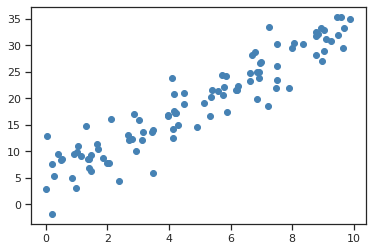

In [8]:
rng = np.random.RandomState(1)
n = 100
x = 10 * rng.rand(n)  # generate random x data
 
true_alpha = 4.0      # define true intercept  
true_beta  = 3.0      # define true slope
error_sd   = 3.5      # define noisiness of the data

y_true = true_alpha + true_beta * x    # define data generating process
y = y_true + rng.randn(n) * error_sd   # add measurment error to make data 'realistic'

plt.scatter(x, y, color='steelblue');

Now let's fit a linear model using SLS.  We'll start by doing this with `sklearn.`

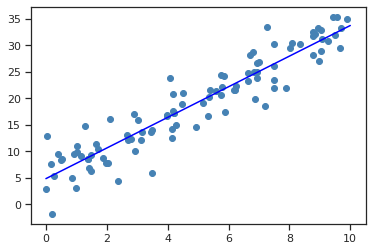

In [9]:
from sklearn.linear_model import LinearRegression
model_ols = LinearRegression(fit_intercept=True)

model_ols.fit(x[:, np.newaxis], y)

x_range = np.linspace(0, 10, 1000)
y_hat   = model_ols.predict(x_range[:, np.newaxis])

plt.scatter(x, y, color='steelblue')
plt.plot(x_range, y_hat,color='blue');

We see how well our estimates match the true data generating function by examining the regression coefficients:

In [10]:
alpha_hat  = model_ols.intercept_
beta_hat   = model_ols.coef_[0]



print("         True   Estimated")
print(f' alpha: {true_alpha:{5}.3}  {alpha_hat:{5}.3}')
print(f' beta : {true_beta:{5}.3}  {beta_hat:{5}.3}')

         True   Estimated
 alpha:   4.0   4.83
 beta :   3.0   2.89


How good a fit do we have?

Well, to analyze this, we would want to look at other statistics such as the $R^2$ and the t-statistics for $\hat{\alpha}$ and $\hat{\beta}$.

It turns out that, while this can be done using `sklearn`, it is not that easy to do (or intuitive), since `sklearn` approaches OLS from a *computational*, rather than *statistical* perspective, and is not really intended for this type of analysis.

On the other hand, we can use `statsmodels` to estimate our model, and it will automatically calculate and display the standard regression statistics and diagnostics:

In [11]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

f   = 'y ~ x'
dat = pd.DataFrame({'x':x,'y':y})
model_ols_sm = smf.ols(f, data=dat).fit()
print(model_ols_sm.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     724.0
Date:                Thu, 17 Feb 2022   Prob (F-statistic):           4.72e-47
Time:                        16:29:30   Log-Likelihood:                -256.00
No. Observations:                 100   AIC:                             516.0
Df Residuals:                      98   BIC:                             521.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.8294      0.610      7.915      0.0

If you are familiar with other statistical analysis software or languages, this output should look very much like what we would expect to see for output for a linear model estimated with OLS.

From this analysis, we can see that both coefficients are highly significant, given the variation in the data itself, and that we the model explained about 80% of the variation in the data.  (Notice also that he actual values of the coeffiecients between the model estimated using `sklearn` and the model estimated using `statsmodels` are nearly identical.)

What about the formula part?

This turns out to be one of the most useful features of `sklearn` in that it allows us to experiment with different independent variabls (and their transforms), without recasting dataframes or adding extra columns, etc.

We will explore the `statsmodels` formula functionality in more detail later on, but to get started, it is helpful to understand how to interpret `y ~ x`.  

Look back to formula [1] above.  Notice that that formula is set up similarly to the `statsmodels` formula:  the dependent variable '`y`' is on the left-hand side and the independent variable '`x`' is on the right-hand side.  The '`~`' character takes the place of the $=$ sign. 

This formula tells the OLS estimation algorithm in `statsmodels` that we wish to estimate a model using `y` as the dependent variable and '`x`' as the independent variable.  The same formula could be used for other kinds of models as well.  In the case of OLS, the formula tells the estimation algorithm to *include* an intercept ($\alpha$) term by default.  (We can remove the intercept by changing the formula a tiny bit.)

# <span style="font-family: Palatino; font-size: 30px; color: purple"> Doing some data science: Predicting who survived the Titanic </span>

Now lets look at some real data.

This time we will use a clasic introductory dataset that contains demographic and traveling information for the Titanic passengers. The goal is to predict the survival of these passengers. We will only keep a few variables of interest and transform all of them to numeric variables. We will also drop some outliers.

In [12]:
# Load data
# path = "./data/titanic.csv"
path="./data/"
fn = "titanic.csv"
full_path= path+fn
df = pd.read_csv(full_path)[["survived", "pclass", "sex", "age", "fare","embarked"]].dropna()

## Familiarizing ourselves with the data 

###  EDA by hand 

In [13]:
# Take a look at the data
# --> Always look at your data before you start anylizing it!

df.head()

,survived,pclass,sex,age,fare,embarked
0,1,1,female,29.0000,211.3375,S
1,1,1,male,0.9167,151.5500,S
2,0,1,female,2.0000,151.5500,S
3,0,1,male,30.0000,151.5500,S
4,0,1,female,25.0000,151.5500,S


In [14]:
# Take a look at how it is distributed
# --> Always look at the distributions of your data before you start anylizing it!

summary_quantiles = [0.01,0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]

print(df.columns)
df.describe(percentiles=summary_quantiles).T

# Transposing the data frame (df.T or df.Transpose())is a good habit for at least two reasons:
#  1) It is cognitively easier to compare columnwise than rowwise
#  2) If you have a lot of variables, it is easier to scroll down to see them rather than to have them scroll off the screen.

Index(['survived', 'pclass', 'sex', 'age', 'fare', 'embarked'], dtype='object')


,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max
survived,1043.0,0.407478,0.491601,0.0000,0.00000,0.0000,0.00,0.00,0.00,1.0000,1.0000,1.00000,1.000,1.0000
pclass,1043.0,2.209012,0.840685,1.0000,1.00000,1.0000,1.00,1.00,2.00,3.0000,3.0000,3.00000,3.000,3.0000
age,1043.0,29.813199,14.366261,0.1667,0.91670,5.0000,14.00,21.00,28.00,39.0000,50.0000,56.00000,65.000,80.0000
fare,1043.0,36.603024,55.753648,0.0000,5.51975,7.2292,7.75,8.05,15.75,35.0771,82.1083,136.66461,262.375,512.3292


At first this seemed to work, but if we look closely, we see that one column is missing (`sex`).  If we want to see that variable, we will need to transform it into a numeric value.

In [15]:
# Transform sex column to a numeric variable
df["female"] = (df.sex == "female").astype(int)
df = df.drop("sex", axis="columns")

# Drop outliers. This is to help the visualization in the next examples.
# --> In general, identifying and determining whether / how to deal with outliers is non-trival
df = df[df.fare < 400]

# Take a look at the data
df.head(10)

,survived,pclass,age,fare,embarked,female
0,1,1,29.0000,211.3375,S,1
1,1,1,0.9167,151.5500,S,0
2,0,1,2.0000,151.5500,S,1
3,0,1,30.0000,151.5500,S,0
4,0,1,25.0000,151.5500,S,1
5,1,1,48.0000,26.5500,S,0
6,1,1,63.0000,77.9583,S,1
7,0,1,39.0000,0.0000,S,0
8,1,1,53.0000,51.4792,S,1
9,0,1,71.0000,49.5042,C,0


###  Exploratory Data Analysis (EDA)

We'd like to use information about the passengers to predict whether they will survive. Let's start by taking a look at how well some of the variables "split" the data according to our target.

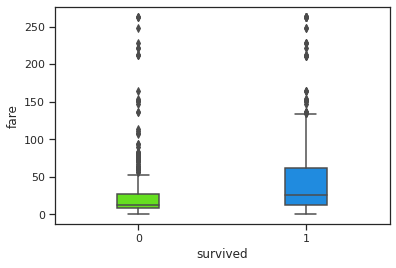

In [16]:
bp=sns.boxplot(x="survived", y="fare", width=0.25, linewidth=1.5, data=df,palette="gist_rainbow")



Above we see boxplots that shows the fare distribution grouped by our target variable (survival). The left boxplot corresponds to people that died and the right one to people that survived. Alternatively, we could plot the distribution of fare according to survival:

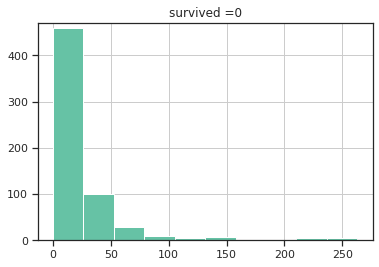

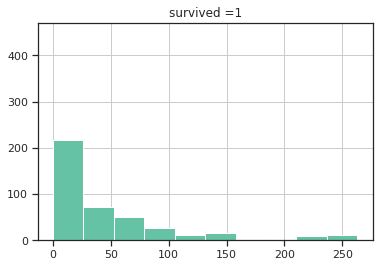

In [17]:
for r in range(2):
    hist = df[df.survived == r].hist('fare')
    plt.title("survived =" + str(r))
    plt.ylim(0,470)
    plt.show()

It seems that people that paid less are less likely to survive. We could use this to predict that people that paid more than 50 will survive. How effective is this threshold? Let's quantify it!

### More EDA

Other observed features may also give us a strong clue about survival.  We could try to get a sense by slicing and plotting the data in a number of ways: 

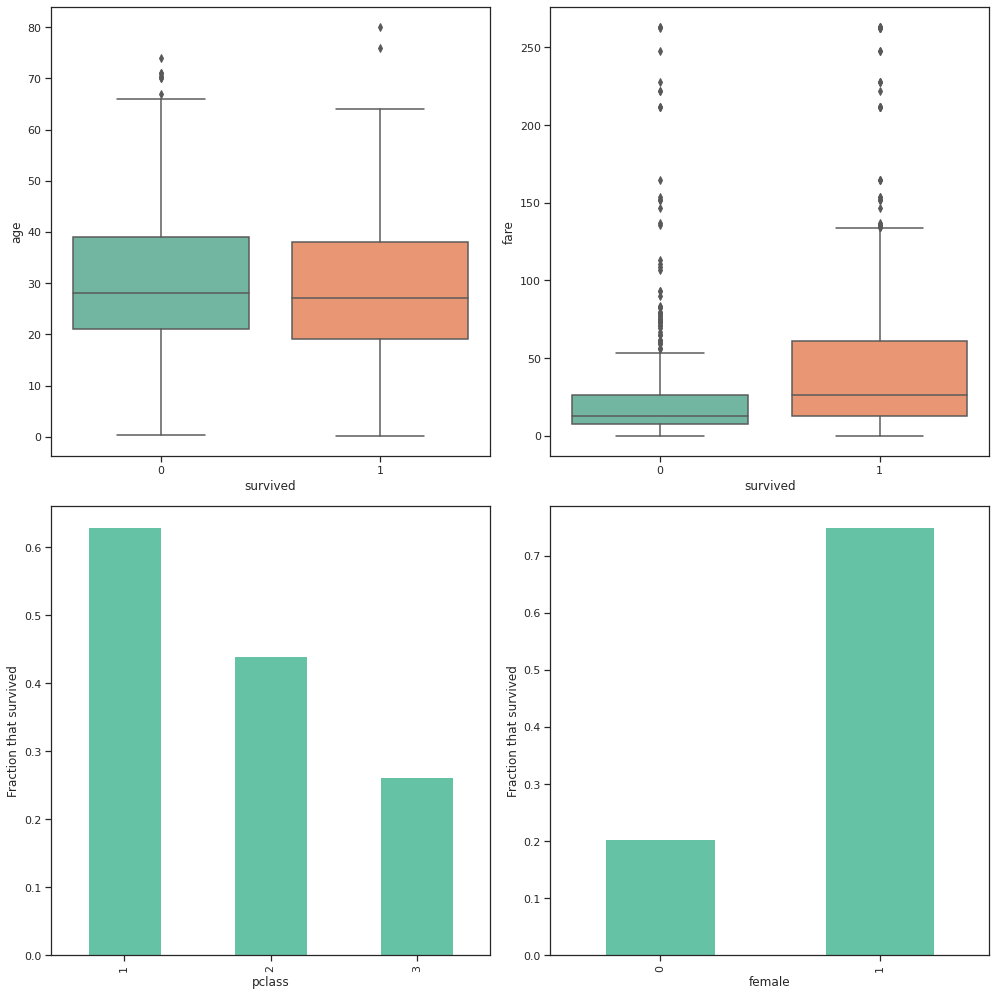

In [18]:
# Names of different columns
categorical_cols = ["pclass", "female"]
continuous_cols = ["age", "fare"]
target_col = "survived"
predictor_cols = categorical_cols + continuous_cols

# This is to plot everything in a 2x2 space
rows, cols = 2, 2
fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(7*cols, 7*rows))
axs = axs.flatten()
posn = 0

# Plot continous features
for col in continuous_cols:
    sns.boxplot(x=target_col, y=col, data=df, ax=axs[posn])
    axs[posn].set_ylabel(col)
    axs[posn].set_title("")
    posn += 1

# Plot categorical features
for col in categorical_cols:
    df.groupby(col)[target_col].mean().plot(kind="bar", ax=axs[posn])
    axs[posn].set_ylabel("Fraction that survived")
    posn += 1
    
plt.tight_layout()

Note the graphs, as we've drawn them here, are a little misleading.  If we're not careful, we might conlcude, by looking at the bottom row, that passengers identifying as female, regardless of passenger class, survived at about the same rate as did first class passengers, regardless of gender.  But this is not the case. The reason that we are tempted to conclude this is that the bars are visually similar in height.  However, this only happened because we did not force the y-axes of the two bottom figures to have the same scale.  

Even if we fixed this, it might *still* be misleading.  (Why?)

To get another perspective, we could try to up our visualization game by putting more information into a single plot.  For example, we can combine the information on passenger outcomes by gender *and* fare in a single visualization.  (We will have to do a little extra work to make it look nice...)  

Let's try that in two different ways:

In [19]:
# Prep to do some cosmetic work based on data

surv_labels = ["died","survived"]
gend_labels = ["male","female"]

surv=[]
gend=[]
for i in df.index:
    x=bool2txt(df.loc[i].at["survived"],surv_labels)
    surv.append(x)
    x=bool2txt(df.loc[i].at["female"],gend_labels)
    gend.append(x)

df["surv_txt"] = surv
df["gend_txt"] = gend

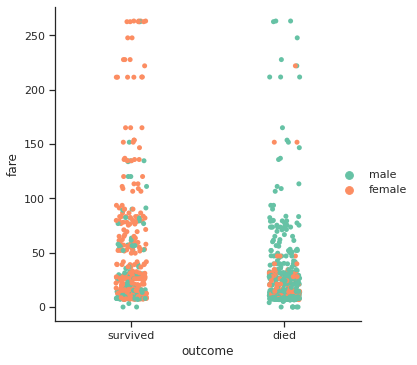

In [20]:
# Plot the data one way...

p1=sns.catplot(x="surv_txt", y="fare", data=df,hue="female")

# Do some more cosmetic work to make plot more cognitively pleasing

p1.set_xlabels("outcome")

for t, l in zip(p1._legend.texts, gend_labels): t.set_text(l)
p1._legend.set_title("")
plt.show()

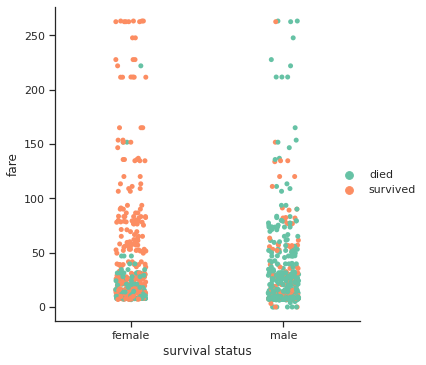

In [21]:
# Plot the data another way...

p2=sns.catplot(x="gend_txt", y="fare", data=df,hue="survived")

# Do some more cosmetic work to make plot more cognitively pleasing

p2.set_xlabels("survival status")

for t, l in zip(p2._legend.texts,surv_labels): t.set_text(l)
p2._legend.set_title("")
plt.show()


# --> It is often the case that packages that make some things really easy require a lot of
#     extra steps if you want to tweak something that is not baked in...

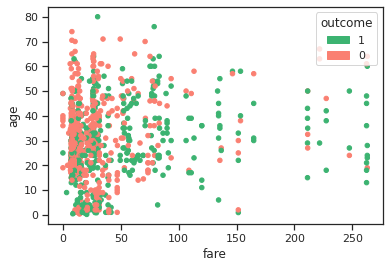

In [22]:
import matplotlib.patches as mpatches

cmap = {1: 'mediumseagreen', 0: 'salmon'}
df.plot(kind="scatter", x="fare", y="age", c=[cmap[c] for c in df[target_col]])
plt.legend(handles=[mpatches.Patch(color=cmap[k], label=k) for k in cmap], loc=1, title="outcome", frameon=True)
plt.show()

This now begs the question: which features provide the most information? 

### EDA the more modern way

In [23]:
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

/home/wolfs/anaconda3/lib/python3.8/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/home/wolfs/anaconda3/lib/python3.8/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)


/home/wolfs/anaconda3/lib/python3.8/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)
/home/wolfs/anaconda3/lib/python3.8/site-packages/dask/utils.py:893: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.
  return getattr(obj, self.method)(*args, **kwargs)



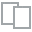
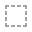
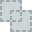
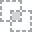
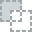
...
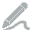
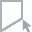
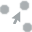
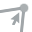
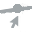

In [24]:
report  = create_report(df)
report.show()

# <span style="font-family: Palatino; font-size: 30px; color: purple"> Building our first classification model</span>

We will start our modeling, as we often do, with "traditional" statistical techniques.  For many problems, conventional statistical or econometric methods are sufficient, or better, than many ML methods, and are often much easier to interpret.

## Estimating the prarameters of a logistic model

### Logistic Regression using `sklearn`

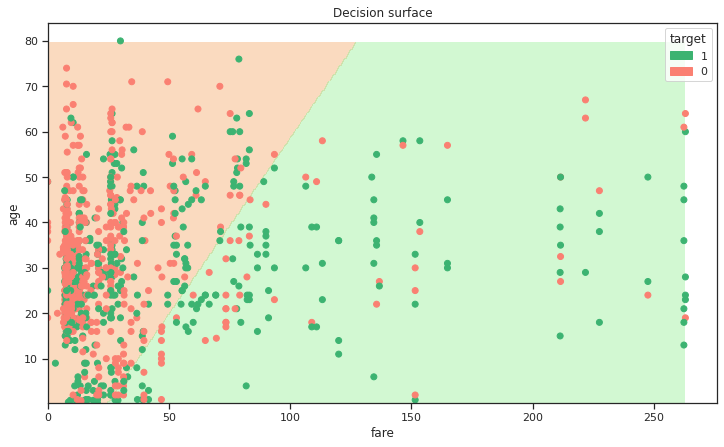

In [25]:
from sklearn import linear_model
import warnings
warnings.filterwarnings('ignore')

logit_model = linear_model.LogisticRegression()
logit_model.fit(X=df[predictor_cols], y=df[target_col])
Decision_Surface(df, "fare", "age", df.survived, logit_model, False)

Let's see if we can get some insight into what is going on in the model by looking at what was estimated. 

`sklearn` does not provide much native ability to do this, but we *can* look at the model coefficients.

In [26]:
logit_model.coef_

array([[-1.14543790e+00,  2.44005785e+00, -3.37893540e-02,
        -1.53759904e-03]])

Hmmmm... Not so easy to parse this info.  If we wanted to, we could write some special functions to try to figure out things like t-statistcs and p-values, but it would be a fair amount of work.

### Logistic Regression using `statsmodels`

In [27]:
# set up the formula.  
#   This is a general code snippet that will always work, even if we don't know the formula
#   In this case, of course, I do know the formua and could just write: survived ~ pclass + female + age + fare
#

my_formula=target_col + ' ~ '
for i in range(len(predictor_cols)):
    if i > 0:
        my_formula = my_formula + " + "       
    my_formula = my_formula+ predictor_cols[i]
print("Formula: ", my_formula)

Formula:  survived ~ pclass + female + age + fare


In [28]:
import statsmodels.formula.api as smf

# We could use this:
#
#   df = sm.add_constant(df, prepend=False)
#   predictor_cols = 'const' + predictor_cols
#   model = sm.Logit(df[target_col], df[predictor_cols])
#   logit_model_sm = model.fit()
#
# But using formulas is easier...

model = smf.logit(my_formula, data = df) 
logit_model_sm = model.fit()
print(logit_model_sm.summary())



Optimization terminated successfully.
         Current function value: 0.470446
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:               survived   No. Observations:                 1039
Model:                          Logit   Df Residuals:                     1034
Method:                           MLE   Df Model:                            4
Date:                Thu, 17 Feb 2022   Pseudo R-squ.:                  0.3031
Time:                        16:29:40   Log-Likelihood:                -488.79
converged:                       True   LL-Null:                       -701.39
Covariance Type:            nonrobust   LLR p-value:                 1.000e-90
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.2570      0.445      5.070      0.000       1.384       3.129
pclass        -1.1807      0.

Note how useful the `statsmodels` output is for gaining insights into the processes that drive the probability of `survival` in the data set.

For example, we can see that all of the variables, except for `fare`, appear to be significant at conventional levels.  

However, the coefficients of a logit are difficult to interpret directly in the same way we interpret the coefficients for a model estimatd useing OLS (because of the non-linear link function).

Fortunately, `statsmodles` also lets us calculate the marginal effects to see the "average" effect of each factor.

In [29]:
mfx = logit_model_sm.get_margeff()
print(mfx.summary())

        Logit Marginal Effects       
Dep. Variable:               survived
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
pclass        -0.1792      0.018     -9.773      0.000      -0.215      -0.143
female         0.3817      0.013     28.837      0.000       0.356       0.408
age           -0.0052      0.001     -5.682      0.000      -0.007      -0.003
fare          -0.0003      0.000     -0.870      0.384      -0.001       0.000


Interesting!  

It looks like on "average,"  a passenger who was `female` would have had a 38% higher chance of survival than one who was `male`. 

How does that overall result compare to how `female` Third Class passengers did releative to `male` Third Class passengers?

In [30]:
pclass_col = 1                      # in which column is the passenger class data located?
is_first_class = {pclass_col: 1}    # map to records of First Class passengers

mfx = logit_model_sm.get_margeff(atexog=is_first_class)
print(mfx.summary())

        Logit Marginal Effects       
Dep. Variable:               survived
Method:                          dydx
At:                           overall
                dy/dx    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
pclass        -0.2080      0.019    -11.151      0.000      -0.245      -0.171
female         0.4432      0.025     17.817      0.000       0.394       0.492
age           -0.0061      0.001     -6.127      0.000      -0.008      -0.004
fare          -0.0003      0.000     -0.878      0.380      -0.001       0.000


It looks like `female` passengers in First Class did even better.  

In fact, in First Class, `female` passengers were about 6% *more* likely to survive (`0.4437` - `0.3821`).  This may be due to the shortage of lifeboats, which were first allocated to the First Class passengers, forcing many lower class passengers into the icy water.

(How big an effect on survival did `pclass` have for `female` passengers?)


# <span style="font-family: Palatino; font-size: 30px; color: purple"> Evaluating the results (a little ...) </span>

We also compute accuracy metrics (for either `scikitlearn` models or `statsmodels` models),  in a number of ways.  

For this example, we are going to calculate a very coarse measure of performance: *the percentage of correct classifications*.  Later in the course, we will look at more robust and informative measures of performance.

In [31]:
# Calculate accuracy using of sklearn logit model using sklearn's metrics package

from sklearn import metrics
pd.DataFrame([dict(zip(predictor_cols, logit_model.coef_[1:]))])
pred = logit_model.predict(df[predictor_cols])
pred_bin    = np.where(pred > 0.5, True, False)  # sk.metrics needs discrete valued data
sk_logit_accuracy = metrics.accuracy_score(pred_bin, df[target_col])   

# Calculate accuracy of statsmodels logit model sklearn's metrics package

pred        = logit_model_sm.predict(df)
pred_bin    = np.where(pred > 0.5, True, False)  # sk.metrics needs discrete valued data
sm_logit_skm_accuracy = metrics.accuracy_score(pred_bin, df.survived)

# Calculate accuracy of statsmodels logit model using statsmodels pred.table (confusion matrix)

logit_pred_tab = logit_model_sm.pred_table()
sm_logit_sm_accuracy = cm2accuracy(logit_pred_tab)



print("Confusion Matrix")

print(pd.DataFrame(logit_pred_tab))
print()

# Compare results

print ("Accuracy (sk logit) fr SKM = %.2f" % sk_logit_accuracy)
print ("Accuracy (sm logit) fr CM  = %.2f" % sm_logit_skm_accuracy)
print ("Accuracy (sm logit) fr SKM = %.2f" % sm_logit_skm_accuracy)



Confusion Matrix
       0      1
0  525.0   93.0
1  125.0  296.0

Accuracy (sk logit) fr SKM = 0.79
Accuracy (sm logit) fr CM  = 0.79
Accuracy (sm logit) fr SKM = 0.79


# <span style="font-family: Palatino; font-size: 30px; color: purple"> Extentions: Transformations

## Motivational example of Polynomial Regression

To appreciate the value of the formula representation that `statsmodels` accomodates, let's develop some intuition by switching back to OLS for a few moments Imagine we have some noisy observations from a nonlinear function. We're going to approximate that function by fitting a polynomial to the observations. 

### Some helper functions for our example

In [32]:

def true_function(X):
    return np.sin(1.5 * np.pi * X)

def plot_example(X, Y, functions,xmax=1,xlim=(0, 1),ylim=(-2, 2), title = ""):
    # Get some X's to plot the functions
    X_test = np.linspace(0, xmax, 100).reshape(-1,1)
    # Plot stuff
    for key in functions:
        plt.plot(X_test, functions[key](X_test), label=key)
    X = X.reshape(X.shape[0])
    plt.scatter(X, Y, edgecolor='lightblue', s=20, label="Samples")
    plt.xlabel("x")
    plt.ylabel("y")
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.title(title)
    plt.legend(loc="best")
    #

### The example

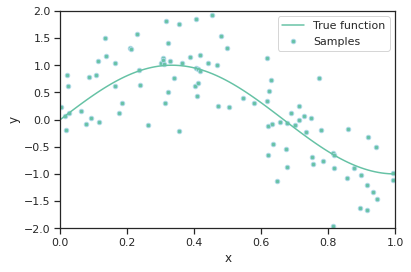

In [33]:
# Define X over the range [0, 1]
num_samples = 100
X = np.sort(np.random.rand(num_samples)).reshape(-1,1)
# Add some random noise to the observations
Y = true_function(X.reshape(X.shape[0])) + np.random.randn(num_samples) * 0.5
# Plot stuff
functions = {"True function": true_function}
plot_example(X, Y, functions)
plt.show()

Let's assume that we don't know the true function, choosing to model our noisy observations using linear regression.  (Recall that we had a sneak peek at building linear regression models in Python at the end of the Class #1 notebook; compare with the fitting of models for binary target variables from last class.)

### Estimation using `sklearn`

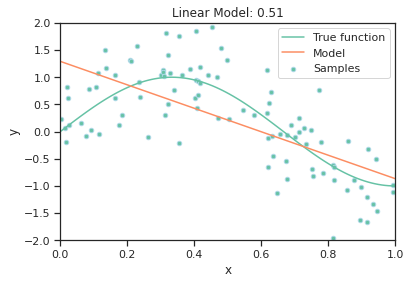

In [34]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Fit linear model
model = LinearRegression()
model.fit(X, Y)
# Evaluate model with mean squared error; just as an example
mse = mean_squared_error(Y, model.predict(X))
# Plot results
functions["Model"] = model.predict
plot_example(X, Y, functions)
#Note how you can customize your plots
title = "Linear Model: %.2f" % mse
plt.title(title)
plt.show()

Clearly the linear regression doesn't fit our data super well. Rather than trying a linear regression, let's attempt polynomial regression. How do different degree polynomials fit the data? Recall that a polynomial on a single variable looks like:

 $$ a_1 + a_2 x + a_3 x^2 + \dots $$

### We need to write some more helper functions...

In [35]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

def plot_poly(X, Y, degree, title = None):
    # Fit polynomial model
    model = fit_polynomial(X.reshape(-1,1), Y, degree)
    # Evaluate model
    mse = mean_squared_error(Y, model.predict(X.reshape(-1,1)))
    # Plot results
    functions["Model"] = lambda x: model.predict(x.reshape(-1,1))
    if title is not None:
        title_txt = title + "(degree %d)\nMSE: %.2f" % (degree, mse)
    else:
        title_txt= "Degree %d\n MSE: %.2f" % (degree, mse)
    plt.title("Degree %d\n MSE: %.2f" % (degree, mse))
    plot_example(X, Y, functions)
    
def fit_polynomial(X, Y, degree):
    # create different powers of X
    polynomial_features = PolynomialFeatures(degree=degree, include_bias=False)
    linear_regression = LinearRegression()
    pipeline = Pipeline([("polynomial_features", polynomial_features), ("linear_regression", linear_regression)])
    pipeline.fit(X, Y)
    return pipeline

### ... so we can plot the results

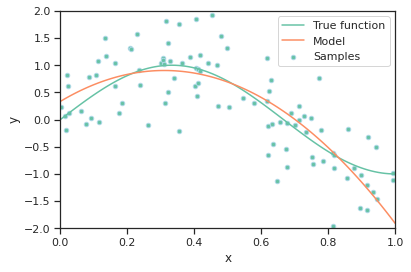

In [36]:
plot_poly(X, Y, degree=2)
plt.show()

This seems to fit our data better than the purely linear model. What if we use polynomials with higher degrees?

### Higher order ploynomials

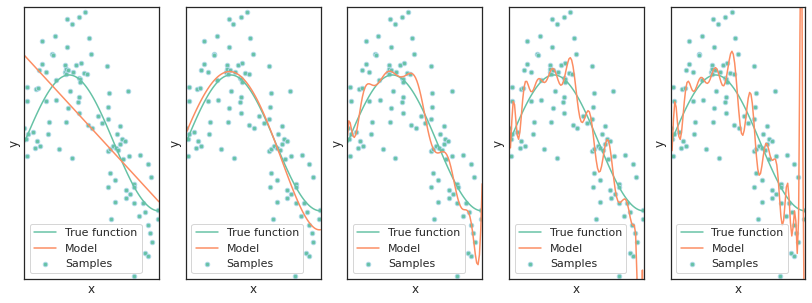

In [37]:
plt.figure(figsize=(14, 5))
# degrees of the polynomial
degrees = [1, 4, 15, 30, 50]
for i in range(len(degrees)):
    ax = plt.subplot(1, len(degrees), i + 1)
    plt.setp(ax, xticks=(), yticks=())
    plot_poly(X, Y, degrees[i])
plt.show()

### Estimation using `statsmodels`

In [38]:
#start with degree 2:
f   = 'y ~ x + I(x**2)'
x = X.reshape(-1)
y = Y
dat = pd.DataFrame({'x':x,'y':y})
poly_ols_sm = smf.ols(f, data=dat).fit()
print(poly_ols_sm.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     86.73
Date:                Thu, 17 Feb 2022   Prob (F-statistic):           2.52e-22
Time:                        16:29:42   Log-Likelihood:                -84.533
No. Observations:                 100   AIC:                             175.1
Df Residuals:                      97   BIC:                             182.9
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3340      0.169      1.972      0.0

### ...and we can plot the results

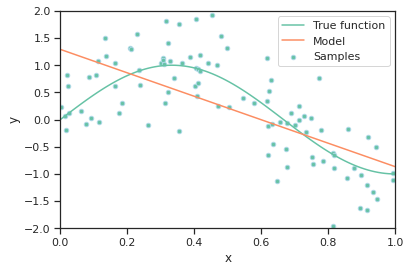

In [39]:
functions["Model"] = lambda x: model.predict(x.reshape(-1,1))
plot_example(X.reshape(-1,1), y, functions)

### Higher order polynomials

highest_degree = 3

f   = 'y ~ x'

for i in range(2,highest_degree+1):
    f = f+" + I(x**%d)" % (i)

poly_ols_sm = smf.ols(f, data=dat).fit()

!!  Notice that we didn't need to create new variables and data frames !!

y ~ x + I(x**2) + I(x**3) + I(x**4) 

y ~ x + I(x**2) + I(x**3) + I(x**4) + I(x**5) + I(x**6) + I(x**7) + I(x**8) + I(x**9) + I(x**10) + I(x**11) + I(x**12) + I(x**13) + I(x**14) + I(x**15) 

y ~ x + I(x**2) + I(x**3) + I(x**4) + I(x**5) + I(x**6) + I(x**7) + I(x**8) + I(x**9) + I(x**10) + I(x**11) + I(x**12) + I(x**13) + I(x**14) + I(x**15) + I(x**16) + I(x**17) + I(x**18) + I(x**19) + I(x**20) + I(x**21) + I(x**22) + I(x**23) + I(x**24) + I(x**25) + I(x**26) + I(x**27) + I(x**28) + I(x**29) + I(x**30) 

y ~ x + I(x**2) + I(x**3) + I(x**4) + I(x**5) + I(x**6) + I(x**7) + I(x**8) + I(x**9) + I(x**10) + I(x**11) + I(x**12) + I(x**13) + I(x**14) + I(x**15) + I(x**16) + I(x**17) + I(x**18) + I(x**19) + I(x**20) + I(x**21) + I(x**22) + I(x**23) + I(x**24) + I(x**25) + I(x**26) + I(x**27) + I(x**28) + I(x**29) + I(x**30) + I(x**31) + I(x**32) + I(x**33) + I(x**34) + I(x**35) + I(x**36) + I(x**37) + I(x**38) + I(x**39) + I(x**40) + I(x**41) + I(x**42) + I(x**43) + I(x**44) + I(x**45) + I(x**

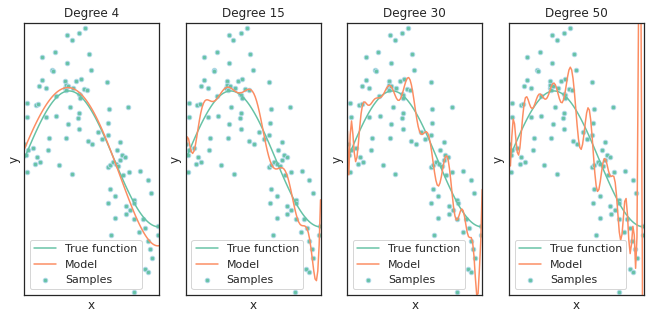

In [41]:
#now scale from degree 1 through 50
plt.figure(figsize=(14, 5))
degrees = [1, 4, 15, 30, 50]  # degrees of the polynomial
highest_degree = degrees[-1]
degree_idx = 0 

f   = 'y ~ x'
for i in range(2,highest_degree+1):
    f = f+" + I(x**%d)" % (i)
    if i in degrees:
        ax = plt.subplot(1, len(degrees), degree_idx + 1)
        plt.setp(ax, xticks=(), yticks=())
        print(f,"\n")
        poly_ols_sm = smf.ols(f, data=dat).fit()
        functions["Model"] =  lambda x: poly_ols_sm.predict(pd.DataFrame(x,columns=["x"])).iloc[0:100]
        title = "Degree %d" % i
        plot_example(X, y, functions,title=title)
        degree_idx +=1
plt.show()


## Log Transforms

Often there are other functional transformations that may improve the fit of your regressions.

### Some helper functions for this example

In [173]:
def true_function(X):
    return np.exp(X)

def true_function_trans(X):
    return X

def transformed_pred(X):
    pred=model.predict(X)
    return np.exp(pred)

### Generate up some example data

ERROR! Session/line number was not unique in database. History logging moved to new session 936


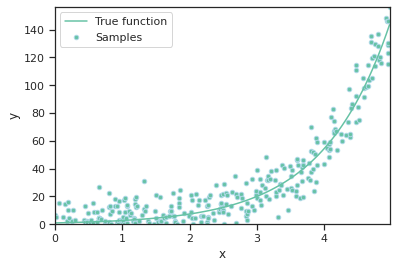

In [174]:
num_samples = 300

# generate some random data
X = np.sort(np.random.random(num_samples))

# scale the data to give a more dramatic shape for example
X = np.abs(X * 5)

# estimate the true function, but then add observational noise
Y = true_function(X) + (10 * np.random.randn(num_samples))
Y = np.abs(Y)

# Plot stuff
functions = {"True function": true_function}
x_max = np.max(X)
y_max = np.max(Y)
plot_example(X, Y, functions,xmax=np.max(X),xlim=(0,x_max),ylim=(0,y_max))
plt.show()

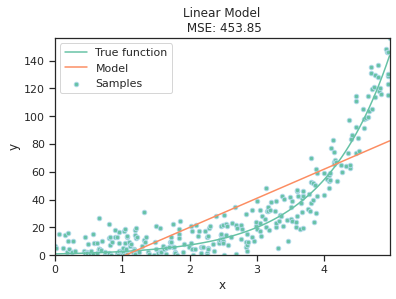

In [175]:
# Fit linear model
model = LinearRegression()
model.fit(X.reshape(-1,1), Y)

# Evaluate model with mean squared error; just as an example
mse = mean_squared_error(Y, model.predict(X.reshape(-1,1)))

# Plot results
functions["Model"] = model.predict
plot_example(X, Y, functions,xmax=np.max(X),xlim=(0,x_max),ylim=(0,y_max))

#Note how you can customize your plots
plt.title("Linear Model\n MSE: %.2f" % mse)
plt.show()

### Perform some simple EDA (we should have done this first!!)

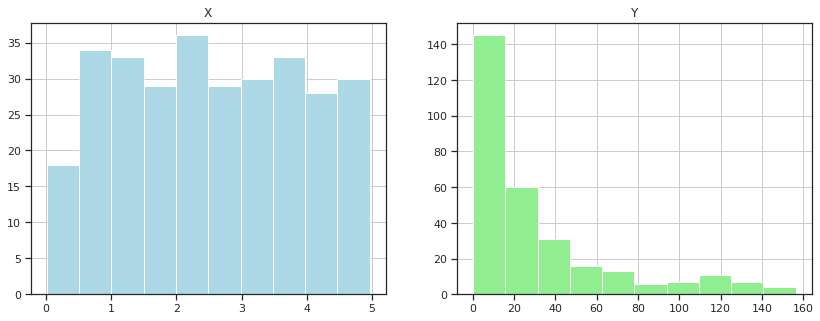

In [176]:
plt.figure(figsize=(14, 5))
Xdf = pd.DataFrame(X)
Ydf = pd.DataFrame(Y)
ax = plt.subplot(1, 2, 1)
plt.title("X") 
Xdf.iloc[:,0].hist(color="lightblue")
ax = plt.subplot(1, 2, 2)
plt.title("Y")
h1 = Ydf.iloc[:,0].hist(color="lightgreen")
plt.show()


`Y` seems to be pretty skewed.  A transform might give a better fit.

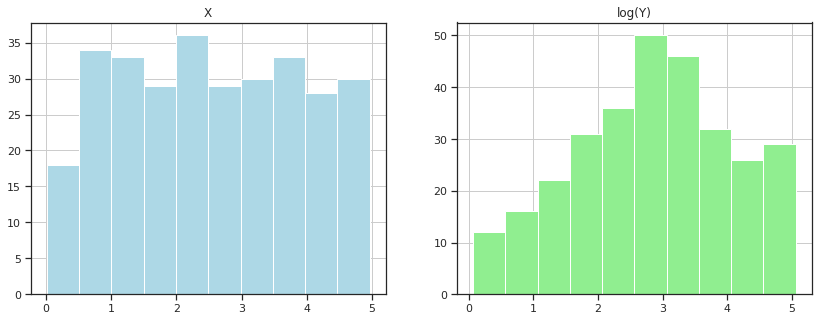

done


In [177]:
transformed_Y = np.log(Y+1)
Ytdf =  pd.DataFrame(transformed_Y)

plt.figure(figsize=(14, 5))
ax = plt.subplot(1, 2, 1)
plt.title("X") 
Xdf.iloc[:,0].hist(color="lightblue")
ax = plt.subplot(1, 2, 2)
plt.title("log(Y)")
h1 = Ytdf.iloc[:,0].hist(color="lightgreen")
plt.show()
print("done")

We can fit a new model and compare the OLS fit using the original and transformed value of `Y`: 

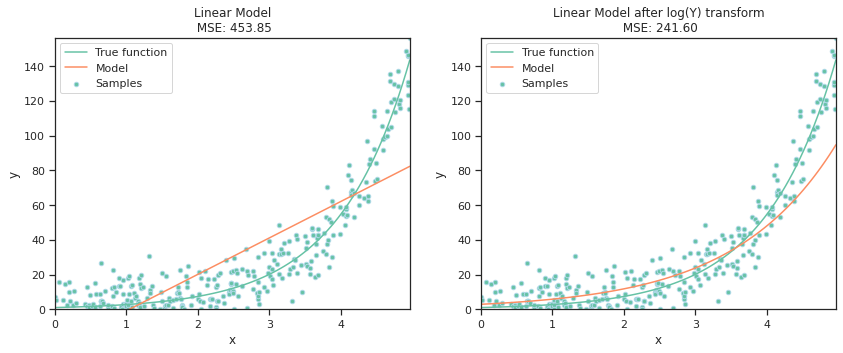

In [178]:
# Fit linear model
model = LinearRegression()
model.fit(X.reshape(-1,1), Y)

# Evaluate model with mean squared error; just as an example
mse = mean_squared_error(transformed_Y, model.predict(X.reshape(-1,1)))

# Plot results

plt.figure(figsize=(14, 5))

ax = plt.subplot(1, 2, 1)
functions["Model"] = model.predict
functions["True function"] = true_function
mse = mean_squared_error(Y, model.predict(X.reshape(-1,1)))
y_max_trans = np.max(transformed_Y)
plot_example(X, Y, functions,xmax=np.max(X),xlim=(0,x_max),ylim=(0,y_max))
plt.title("Linear Model\n MSE: %.2f" % mse)

model.fit(X.reshape(-1,1), transformed_Y)
functions["Model"] = transformed_pred
functions["True function"] = true_function
mse = mean_squared_error(Y, transformed_pred(X.reshape(-1,1)))

ax = plt.subplot(1, 2, 2)
plot_example(X, Y, functions,xmax=np.max(X),xlim=(0,x_max),ylim=(0,y_max))
plt.title("Linear Model after log(Y) transform\n MSE: %.2f" % mse)
plt.show()

How would we do this in `statsmodels`?

## Outlier Detection

Outlier are data points that lie outside of the *regular* distribution data points. The definition of *regular* is based on the context of the data. Many times when fitting a model particularly models that are sensitive to outliers like linear models, it is important to consider the effects of outliers. Treatment of outliers, as with many other things that we have seen, is context dependent. Assume, for instance, that we have 1000's of datapoints of companies that did/did not default and we are trying to predict default. When a company deviates significantly on it's credit rating (which would be considered an outlier), a low rating may indicate default and thus be a very good predictor. Whereas companies that deviate on square foot of office space, may indicate that the companies at hand are too small to be considered by the modeler and should be removed.

Either way, detecting outlier is usually a crucial step in data analysis/model building. We discuss here the simplest method of detecting outliers called bivariate.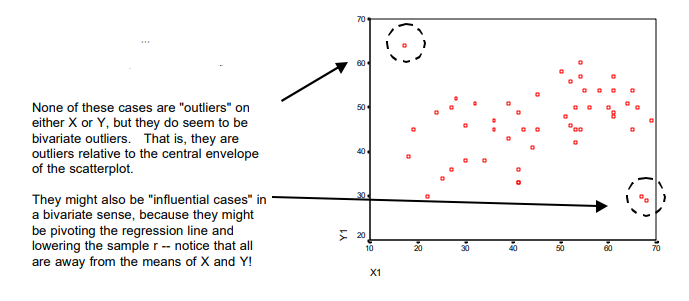 Outliers are bivariate if they deviate along X and Y, when examined relative to other (X,Y) points.

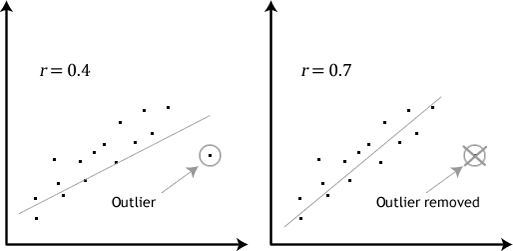

## Resources

Outliers:
https://towardsdatascience.com/a-brief-overview-of-outlier-detection-techniques-1e0b2c19e561

